## Imports

In [4]:
import pandas as pd
import numpy as np

import tensorflow as tf
from tensorflow import keras

import os
import pickle
import imghdr
import cv2
from PIL import Image

import time
from plotly import express as px

## Load data

In [2]:
img_name_list_train = os.listdir('../data_plant_disease/train_images/')
img_name_list_test = os.listdir('../data_plant_disease/test_images/')

train_labels = pd.read_csv('../data_plant_disease/train.csv')

In [3]:
image_extensions = ['jpeg', 'jpg', 'bmp', 'png']

In [4]:
# # clean wrong images in dataset if there is

# for index, image in enumerate(img_name_list_train):
    
#     try: 
#         image_path = f'../data_plant_disease/train_images/{image}'
#         img = cv2.imread(image_path)
#         tip = imghdr.what(image_path)
#         if tip not in image_extensions:
#             os.remove(image_path)
        
#     except Exception as e:
#         print('Issue with image {}'.format(image_path))
        
#     if index%1000==0:
#         print(f'loading... {index}/{len(img_name_list_train)}')

loading... 0/18632
loading... 1000/18632
loading... 2000/18632
loading... 3000/18632
loading... 4000/18632
loading... 5000/18632
loading... 6000/18632
loading... 7000/18632
loading... 8000/18632
loading... 9000/18632
loading... 10000/18632
loading... 11000/18632
loading... 12000/18632
loading... 13000/18632
loading... 14000/18632
loading... 15000/18632
loading... 16000/18632
loading... 17000/18632
loading... 18000/18632


In [14]:
from matplotlib import pyplot as plt
from plotly import express as px

### Explore the images

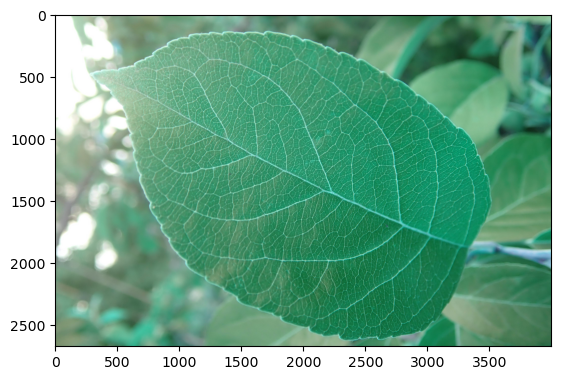

In [26]:
# one image

plt.imshow(img)
plt.show()

### first 10 images

In [39]:
# clean wrong images in dataset if there is

img_sample = []

for  image in img_name_list_train[:10]:
    
        image_path = f'../data_plant_disease/train_images/{image}'
        img = cv2.imread(image_path)
        img_sample.append(img)
        
        

In [40]:
label_sample = train_labels.head(10)['labels']

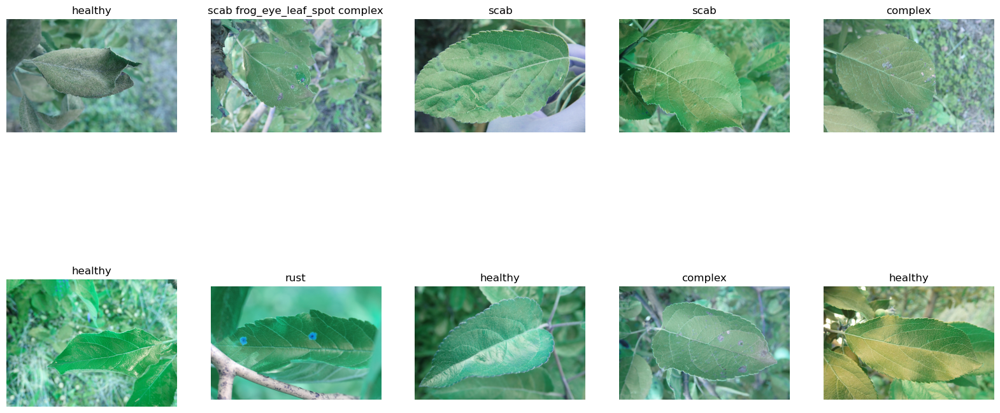

In [49]:
# Set up the subplot grid
fig, ax = plt.subplots(2, 5, figsize=(20,10))

# Flatten the subplot array to simplify iteration
ax = ax.flatten()

# Plot each image in its own subplot
for i, ax_i in enumerate(ax):
    ax_i.imshow(img_sample[i])
    ax_i.set_title(label_sample[i])
    ax_i.axis('off')

### Exploring 5 of each label

In [56]:
labels = train_labels['labels'].unique()
n = train_labels['labels'].nunique()

print(f'There is {n} labels for the plant')

There is 12 labels for the plant


In [66]:
# getting 5 of each label
sample = pd.DataFrame()

for label in labels:

    # get sample of 5 for a label
    sample = pd.concat([sample, train_labels.loc[train_labels['labels'] == label, :].sample(5)])
    

In [71]:
sample = sample.reset_index(drop=True)

In [72]:
sample

,image,labels
0,c4e63c0ef61b9b81.jpg,healthy
1,a17dd7f01bc70116.jpg,healthy
2,fca7d2428baa9aa2.jpg,healthy
3,97c0d31d3c343b36.jpg,healthy
4,f2c4c7d80cdcf832.jpg,healthy
5,e298c74765261d9d.jpg,scab frog_eye_leaf_spot complex
6,b882c18b879fcd69.jpg,scab frog_eye_leaf_spot complex
7,c3976ee664e640e1.jpg,scab frog_eye_leaf_spot complex
8,ada7c4b3c469887a.jpg,scab frog_eye_leaf_spot complex
9,a7d5ca94958b38c5.jpg,scab frog_eye_leaf_spot complex


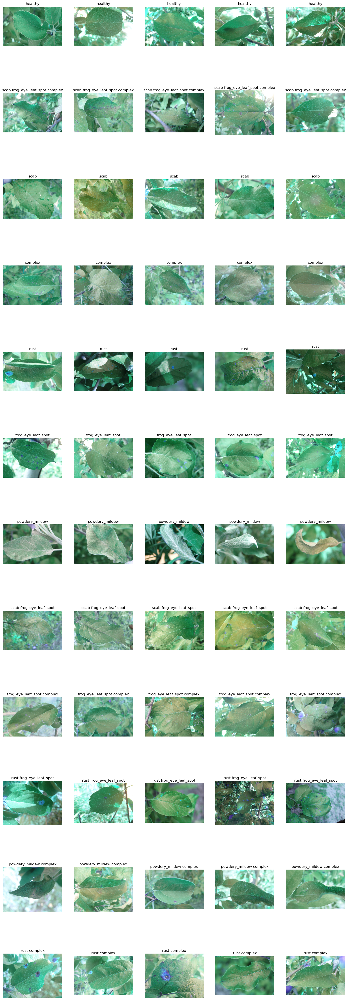

In [89]:
# Set up the subplot grid
fig, ax = plt.subplots(12, 5, figsize=(20,60))

# Flatten the subplot array to simplify iteration
ax = ax.flatten()

# Plot each image in its own subplot
for i, ax_i in enumerate(ax):
    image_path = f'../data_plant_disease/train_images/{sample.iloc[i, 0]}'
    img = cv2.imread(image_path)
    ax_i.imshow(img)
    ax_i.set_title(sample.iloc[i, 1])
    ax_i.axis('off')

## Check class balance

In [8]:
count_class = train_labels.groupby('labels').count().reset_index()

px.bar(count_class, y='labels',x='image')

## Save images in numpy array

In [ ]:
# Read each .jpeg file and store it as a numpy array
images = []
s = time.time()


for index, file in enumerate(files):
    with Image.open(os.path.join(path, file)) as img:
        images.append(np.array(img))
        
    if index%1000==0:
        
        e = time.time()
        print(f'loading... {index}/{len(files)} time: {(e-s)/60:.2f} min')
        s = time.time()
        
        
# Convert the list of images to a numpy array
images = np.array(images)

loading... 0/18632 time: 0.00 min
loading... 1000/18632 time: 4.05 min


In [2]:
# Load the numpy array from the binary file using pickle
with open("images.pkl", "rb") as f:
    images = pickle.load(f)

In [9]:
from matplotlib import pyplot as plt

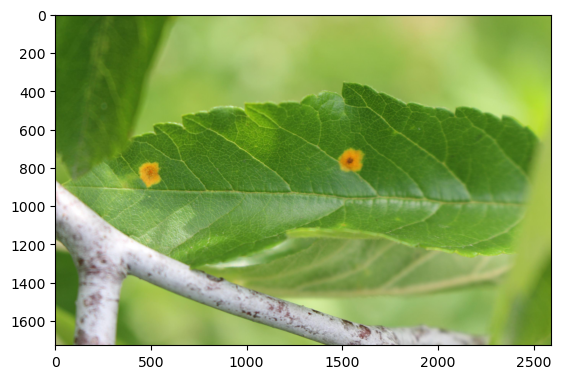

In [10]:
plt.imshow(images[0])

## Create one folder per class and move the images

In [12]:
import os
import pandas as pd

path = ".\"

# Ler o arquivo CSV
df = pd.read_csv("train_labels.csv")

# Obter o nome das classes únicas
classes = df['classe'].unique()

# Criar uma pasta para cada classe
for classe in classes:
    os.makedirs(classe, exist_ok=True)

# Mover as imagens para as pastas correspondentes
for index, row in df.iterrows():
    os.rename(path + row['nome_da_imagem'], path + f"{row['classe']}/{row['nome_da_imagem']}")

SyntaxError: EOL while scanning string literal (4156938111.py, line 4)